<a href="https://colab.research.google.com/github/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/StimulationAnalysis/stimulation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!date

Fri Mar  4 21:35:55 UTC 2022


### **Download Data**

In [1]:
import requests
from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
    url = 'https://api.datacite.org/dois/'+doi+'/media'
    r = requests.get(url).json()
    netcdf_url = r['data'][0]['attributes']['url']
    r = requests.get(netcdf_url,stream=True)
    #Set file name
    fname = doi.split('/')[-1]+ext
    #Download file with progress bar
    if r.status_code == 403:
        print("File Unavailable")
    if 'content-length' not in r.headers:
        print("Did not get file")
    else:
        with open(fname, 'wb') as f:
            total_length = int(r.headers.get('content-length'))
            pbar = tnrange(int(total_length/1024), unit="B")
            for chunk in r.iter_content(chunk_size=1024):
                if chunk:
                    pbar.update()
                    f.write(chunk)
        return fname

In [2]:
#Import raw, unclustered stimulation data
download_file('10.22002/D1.1814','.gz')

#Import cell barcodes --> individual ID matrix from ClickTag filtering
download_file('10.22002/D1.1817','.gz')

<ipython-input-1-3d0e4fc72fc7>:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  pbar = tnrange(int(total_length/1024), unit="B")


  0%|          | 0/78502 [00:00<?, ?B/s]

  0%|          | 0/183 [00:00<?, ?B/s]

'D1.1817.gz'

In [7]:
#Import previously saved, clustered, & filtered stimulation data
download_file('10.22002/D1.1821','.h5ad')

<ipython-input-1-3d0e4fc72fc7>:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  pbar = tnrange(int(total_length/1024), unit="B")


  0%|          | 0/1048379 [00:00<?, ?B/s]

'D1.1821.h5ad'

In [4]:
#Import merged data with knn clusters
download_file('10.22002/D1.1823','.gz')

<ipython-input-1-3d0e4fc72fc7>:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  pbar = tnrange(int(total_length/1024), unit="B")


  0%|          | 0/257856 [00:00<?, ?B/s]

'D1.1823.gz'

In [5]:
#Gene Markers to plot (for cell atlas) --> Fig 2 heatmap
download_file('10.22002/D1.1809','.gz')

<ipython-input-1-3d0e4fc72fc7>:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  pbar = tnrange(int(total_length/1024), unit="B")


  0%|          | 0/2 [00:00<?, ?B/s]

'D1.1809.gz'

In [6]:
#Kallisto bus clustered starvation data, h5ad
download_file('10.22002/D1.1796','.gz')

#Neurons from fed/starved
download_file('10.22002/D1.1804','.gz')

#Saved DeSeq2 genes for stimulation perturbations
download_file('10.22002/D1.1818','.gz')

<ipython-input-1-3d0e4fc72fc7>:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  pbar = tnrange(int(total_length/1024), unit="B")


  0%|          | 0/479630 [00:00<?, ?B/s]

  0%|          | 0/1595 [00:00<?, ?B/s]

  0%|          | 0/321 [00:00<?, ?B/s]

'D1.1818.gz'

In [8]:
#Human ortholog annotations
download_file('10.22002/D1.1819','.gz')

#Panther annotations
download_file('10.22002/D1.1820','.gz')

#GO Terms
download_file('10.22002/D1.1822','.gz')

<ipython-input-1-3d0e4fc72fc7>:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  pbar = tnrange(int(total_length/1024), unit="B")


  0%|          | 0/528 [00:00<?, ?B/s]

  0%|          | 0/515 [00:00<?, ?B/s]

  0%|          | 0/227 [00:00<?, ?B/s]

'D1.1822.gz'

In [9]:
!gunzip *.gz


gzip: D1.1821.gz: not in gzip format


In [10]:
!pip install --quiet anndata
!pip install --quiet scanpy #==1.7.0rc1
!pip install --quiet louvain


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.2/104.2 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 15.9 MB/s eta 0:00:00


In [11]:
!pip3 install --quiet rpy2

###**Import Packages**

In [12]:
import scanpy as sc
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import scipy.sparse
import scipy.io as sio
import seaborn as sns
import random

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

sc.set_figure_params(dpi=125)
%load_ext rpy2.ipython

In [13]:
#Read in annotations
from io import StringIO

hg_ortho_df = pd.read_csv(StringIO(''.join(l.replace('|', '\t') for l in open('D1.1819'))),
            sep="\t",header=None,skiprows=[0,1,2,3])

hg_ortho_df[['XLOC','TCONS']] = hg_ortho_df[13].str.split(expand=True)
hg_ortho_df[['Gene','gi']] = hg_ortho_df[3].str.split(expand=True)
hg_ortho_df['Description']= hg_ortho_df[11]


panther_df = pd.read_csv('D1.1820',
            sep="\t",header=None) #skiprows=[0,1,2,3]



goTerm_df = pd.read_csv('D1.1822',
            sep=" ",header=None) #skiprows=[0,1,2,3]


###**How Stim Data was Clustered/Filtered**

Clustering kallisto quantification output and applying 36 cell type labels

In [14]:
#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')
sc.pp.filter_cells(bus_stim, min_counts=1)
sc.pp.filter_genes(bus_stim, min_counts=1)
bus_stim.obs['n_countslog']=np.log10(bus_stim.obs['n_counts'])

In [ ]:
#Median Genes/cell
nonZero = bus_stim.X.todense() != 0.0
nonZeroCounts = np.sum(nonZero,axis=1)
nonZeroCounts.shape
print('Median genes/cell:' + str(np.median(list(nonZeroCounts))))

Median genes/cell:1303.0


In [ ]:
#Median UMIs/cell
print('Median UMIs/cell:' + str(np.median(bus_stim.obs['n_counts'])))

Median UMIs/cell:4297.0


In [ ]:
#Normalize
sc.pp.normalize_per_cell(bus_stim, counts_per_cell_after=1e4) #or 1e5
bus_stim.raw = sc.pp.log1p(bus_stim, copy=True)
filter_result = sc.pp.filter_genes_dispersion(
    bus_stim.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)

In [ ]:
bus_stim = bus_stim[:, filter_result.gene_subset]

print(bus_stim)

View of AnnData object with n_obs × n_vars = 23057 × 10260
    obs: 'batch', 'n_counts', 'n_countslog'
    var: 'n_counts'


In [ ]:
#Clustering and visualization

sc.pp.scale(bus_stim, max_value=10)
sc.tl.pca(bus_stim, n_comps=60)
#sc.tl.tsne(bus_stim, n_pcs=30)

sc.pp.neighbors(bus_stim,n_neighbors=50, n_pcs=30) #n_neighbors=5, n_pcs=15
#sc.tl.leiden(bus_stim, resolution=0.8)
sc.tl.louvain(bus_stim, resolution=0.7)
sc.tl.umap(bus_stim)

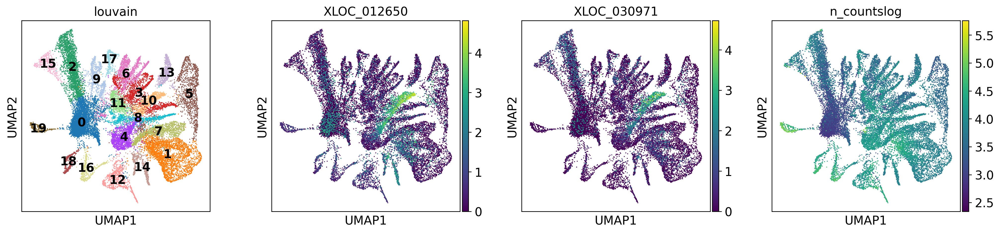

In [ ]:
sc.pl.umap(bus_stim, color=['louvain','XLOC_012650','XLOC_030971','n_countslog'],legend_loc='on data',color_map='viridis') #leiden

Filter for cells selected by ClickTag pre-processing and add organism condition information

In [ ]:
#Assign labels to cells (condition and organism ID/#)
!mv D1.1817 jelly4stim_individs_tagCells_50k.mat
barcodes_list = sio.loadmat('jelly4stim_individs_tagCells_50k.mat')
barcodes_list.pop('__header__', None)
barcodes_list.pop('__version__', None)
barcodes_list.pop('__globals__', None)

# Add all cell barcodes for each individual
barcodes = []
for b in barcodes_list:
    if barcodes_list[b] != "None":
        barcodes.append(b)

print(len(barcodes))

barcodes = [s.replace('-1', '-3') for s in barcodes]
barcodes = [s.replace('-2', '-1') for s in barcodes]
barcodes = [s.replace('-3', '-2') for s in barcodes]



#Flip -1 -2 labels (from Miseq/Hiseq lane ordering)
def convertCode(b_list):
    b_list = [s.replace('-1', '-3') for s in b_list]
    b_list = [s.replace('-2', '-1') for s in b_list]
    b_list = [s.replace('-3', '-2') for s in b_list]
    return b_list

def convertCode_str(b):
    b = b.replace('-1', '-3')
    b = b.replace('-2', '-1')
    b = b.replace('-3', '-2')
    return b

fixed_bars = {}
for b in barcodes:
    fixed_bars[b] = barcodes_list[convertCode_str(b)][0]

#Add condition labels to individuals
ids = []
for name in bus_stim.obs_names.tolist():
    for barcode, individ in fixed_bars.items():
        if (name in barcode):
            ids += [int(individ)]

condition = ['SW','SW','SW','SW','DI','DI','DI','DI','KCl','KCl','KCl','KCl']

#Add ID numbers to individuals
labels = []
for name in bus_stim.obs_names.tolist():
    for barcode, individ in fixed_bars.items():
        if name in barcode:
            labels += [condition[int(individ)-1]]

bus_stim.obs['condition'] = pd.Categorical(labels)
bus_stim.obs['orgID'] = pd.Categorical(ids)
bus_stim

23058


AnnData object with n_obs × n_vars = 23057 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'condition', 'orgID'
    var: 'n_counts', 'mean', 'std'
    uns: 'pca', 'neighbors', 'louvain', 'umap', 'louvain_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
#Remove low count region, '0'
bus_combo_noZero = bus_stim[~bus_stim.obs['louvain'].isin(['0'])] #leiden

bus_combo_noZero.write('bus_stim.h5ad')

###**Analysis of Stimulation Experiment with previously saved data**

In [15]:
#Saved Filtered and clustered h5ad

#Stimulation data
bus_stim_clus = anndata.read('D1.1821.h5ad')

print(bus_stim_clus)

#Merged experimental data
overlap_combo = anndata.read('D1.1823')
print(overlap_combo )

#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')

AnnData object with n_obs × n_vars = 18921 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'condition', 'orgID', 'cellRanger_louvain', 'annos', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'condition_colors', 'louvain', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 32594 × 6756
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub', 'condition', 'cell_origin', 'knn_clus'
    var: 'n_counts-0', 'mean-0', 'std-0', 'n_counts-1', 'mean-1', 'std-1', 'mean', 'std'
    uns: 'pca'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'


In [16]:
#Starvation data
bus_fs_clus = anndata.read('D1.1796')

In [ ]:
sc.pp.filter_cells(bus_stim, min_counts=1)
sc.pp.filter_genes(bus_stim, min_counts=1)
np.sum(bus_stim[list(bus_stim_clus.obs_names),:].X) #Number of unique reads

170722140.0

In [ ]:
#Markers for cell atlas heatmap (Fig 2b)
markers = pd.read_csv('D1.1809')
markers.head()

,clus,markerGene,annot,orthoGene,orthoDescr,pantherID,pantherDescr,source
0,0,XLOC_010813,DDX39A/B,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],
1,0,XLOC_008430,PA2G4,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']",
2,1,XLOC_016073,ZP-containing-1,NaN,NaN,['PTHR11576'],['ZONA PELLUCIDA SPERM-BINDING PROTEIN 3'],
3,2,XLOC_006164,FMN-reductiase,NaN,NaN,['PTHR30543:SF12'],['NAD(P)H-DEPENDENT FMN REDUCTASE LOT6'],
4,3,XLOC_013735,Innexin-like,NaN,NaN,['PTHR11893:SF41'],['INNEXIN INX7'],


In [ ]:
#Stimulation DE Genes
deGenes = pd.read_csv('D1.1818')
deGenes.head()

,Unnamed: 0.1,Unnamed: 0,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,1,XLOC_034855,0,KCl,3.353751e-21,8.719752e-20,-2.636114,NaN,NaN,NaN,NaN,NaN
1,1,2,XLOC_036454,0,KCl,1.106672e-18,2.877347e-17,-1.654651,NaN,NaN,['PTHR10127'],"['DISCOIDIN, CUB, EGF, LAMININ , AND ZINC META...","['GO:0007498,GO:0005488,GO:0008233,GO:0008237,..."
2,2,3,XLOC_001437,0,KCl,1.252213e-16,3.255753e-15,-1.739563,NaN,NaN,NaN,NaN,NaN
3,3,4,XLOC_008048,0,KCl,1.019006e-15,2.649416e-14,-1.785947,LOC102723665,PREDICTED: basic proline-rich protein-like [H...,['PTHR24637:SF339'],['CUTICLE COLLAGEN 79-RELATED'],"['GO:0032502,GO:0016337,GO:0007398,GO:0007498,..."
4,4,5,XLOC_044068,0,KCl,1.671318e-15,4.345426e-14,-1.664870,NaN,NaN,NaN,NaN,[nan]


In [ ]:
bus_stim_clus.obs['cellRanger_louvain'] = pd.Categorical(overlap_combo[overlap_combo.obs['cell_origin'] == 'Stim'].obs['knn_clus'])

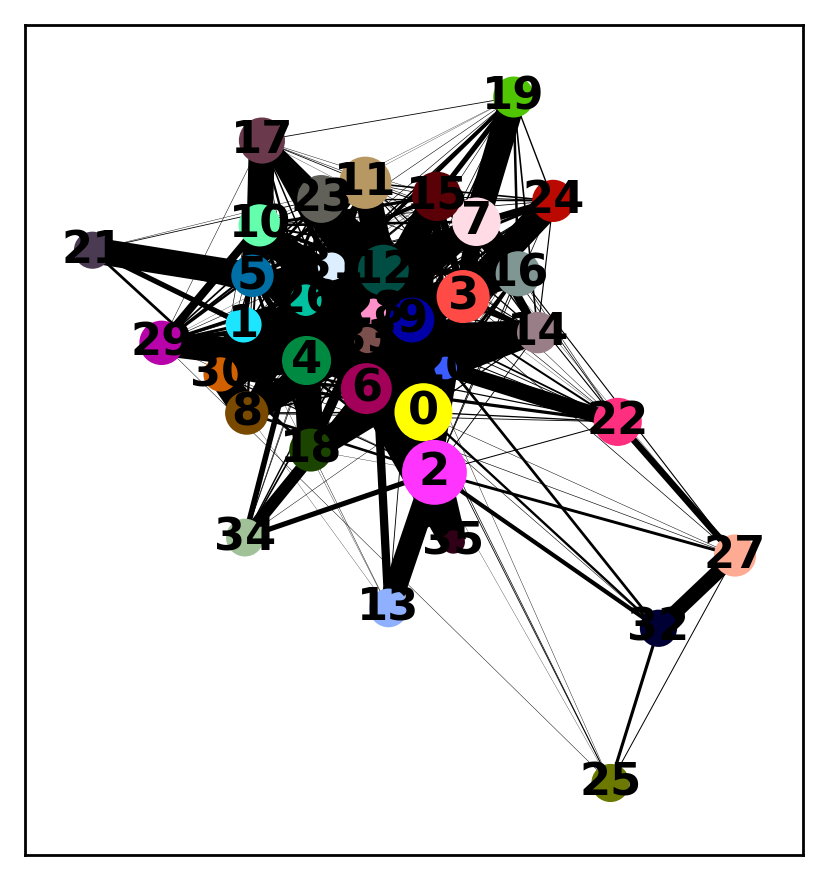

In [ ]:
#Exact values for generating UMAP/PAGA embedding for stimulation data
#sc.pp.neighbors(bus_stim_clus,n_neighbors=30, n_pcs=30) #use_rep='X_nca'
#sc.tl.paga(bus_stim_clus, groups='cellRanger_louvain')
sc.pl.paga(bus_stim_clus, color=['cellRanger_louvain'])

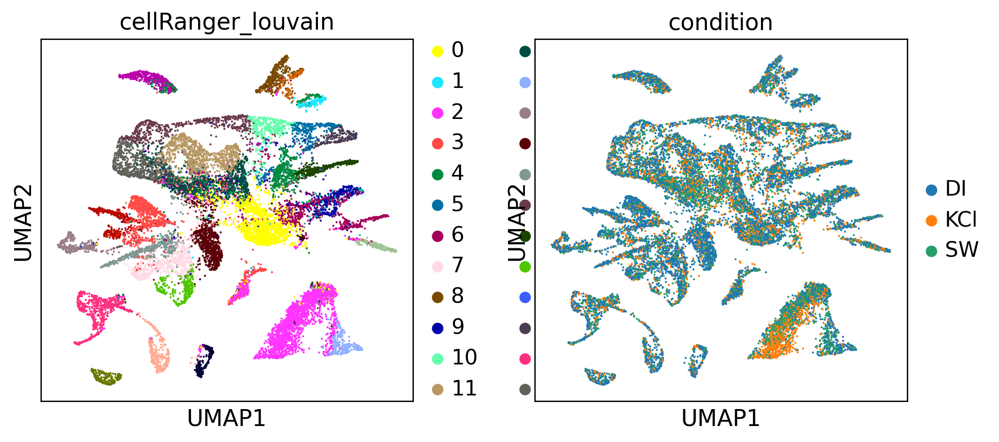

In [ ]:
#Exact inputs for umap embedding
#sc.tl.umap(bus_stim_clus,random_state=42,init_pos='paga',spread=2.0)
sc.pl.umap(bus_stim_clus, color=['cellRanger_louvain','condition'],color_map='viridis')

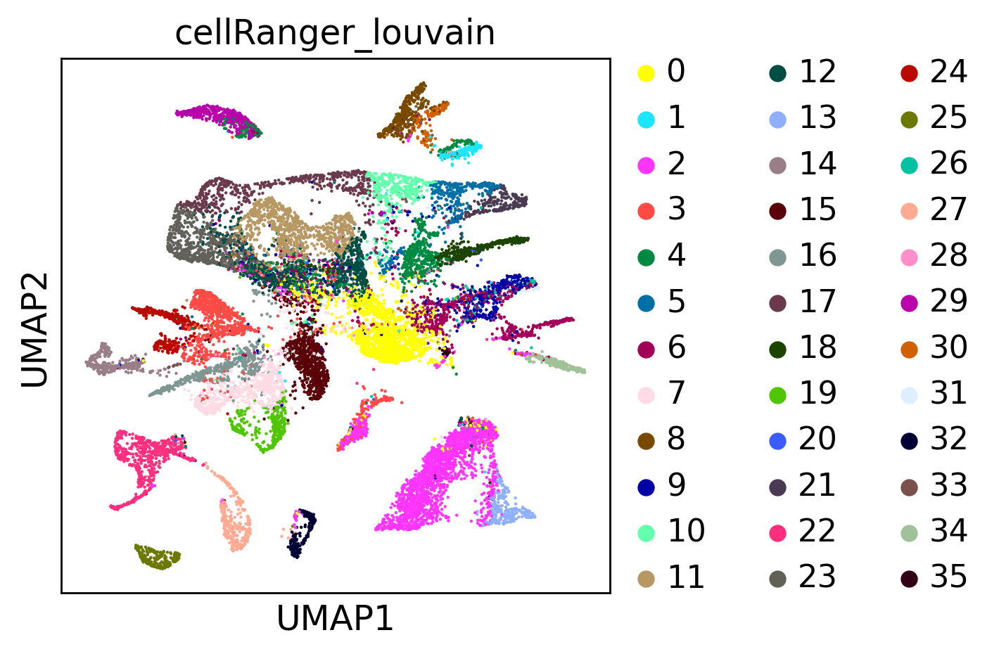

In [ ]:
sc.pl.umap(bus_stim_clus, color=['cellRanger_louvain'],color_map='viridis')

In [ ]:
# Saved adata usedd for this analysis
#bus_stim_clus.write('bus_stim.h5ad')

####**Application of Cluster Labels/Analysis of Label Fit**

Here we apply the 36 cell type labels and look at the overlap in marker genes for these clusters versus markers from the starvation experiment

In [ ]:
#First apply high level cluster labels
#Defining the eight main classes

def annotateLouvain(bus_fs_clus):
  cluster_types = []

  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35,13,2,0]:
      cluster_types += ['Stem Cell/Germ Cell']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12,11,23,17,5,10,21]:
      cluster_types += ['Nematocyte']
    # elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5,10,21]:
    #   cluster_types += ['Mechanosensory']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6,9,26,31]:
      cluster_types += ['Neural']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34,22,27,32,25]:
      cluster_types += ['Gland Cell']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3,7,14,15,19,24,16,33]:
      cluster_types += ['Gastroderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1,4,29,18,8,30,20]:
      cluster_types += ['Epidermal/Muscle']


  bus_fs_clus.obs['annos'] = pd.Categorical(cluster_types)

annotateLouvain(bus_stim_clus)
bus_stim_clus

AnnData object with n_obs × n_vars = 18921 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'condition', 'orgID', 'cellRanger_louvain', 'annos', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'condition_colors', 'louvain', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
#Names for 36 subclusters
def annotateLouvainSub(bus_fs_clus):
  cluster_types = []

  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12]:
      cluster_types += ['Nematocyte Precursors']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [17]:
      cluster_types += ['Late Nematoblasts']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [11]:
      cluster_types += ['Early Nematoblasts']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [23]:
      cluster_types += ['Mid Nematoblasts']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2]:
      cluster_types += ['Medium Oocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [13]:
      cluster_types += ['Small Oocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7]:
      cluster_types += ['GastroDigestive-B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [15]:
      cluster_types += ['GastroDigestive-D']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3]:
      cluster_types += ['GastroDigestive-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [14]:
      cluster_types += ['GastroDigestive-C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [19]:
      cluster_types += ['GastroDigestive-E']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [24]:
      cluster_types += ['GastroDigestive-F']


    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5]:
      cluster_types += ['Terminal Differentiating Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [10]:
      cluster_types += ['Differentiating Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [21]:
      cluster_types += ['Mature Nematocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['i-Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6]:
      cluster_types += ['Neural Cells Early Stages']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [9]:
      cluster_types += ['Neural Cells-A (incl. GLWa, MIH cells)']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [26]:
      cluster_types += ['Neural Cells-B (incl. RFamide cells)']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [31]:
      cluster_types += ['Neural Cells-C (incl. YFamide cells)']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle of Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Distal Gastroderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['Gland Cells-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cells-C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Gland Cells-B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Tentacle GFP Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle of Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Gland Cells-D']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Gland Cells-E']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Very Early Oocytes']

  bus_fs_clus.obs['annosSub'] = pd.Categorical(cluster_types)

annotateLouvainSub(bus_stim_clus)
bus_stim_clus

AnnData object with n_obs × n_vars = 18921 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'condition', 'orgID', 'cellRanger_louvain', 'annos', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'condition_colors', 'louvain', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
bus_stim_clus.write('bus_stim.h5ad')

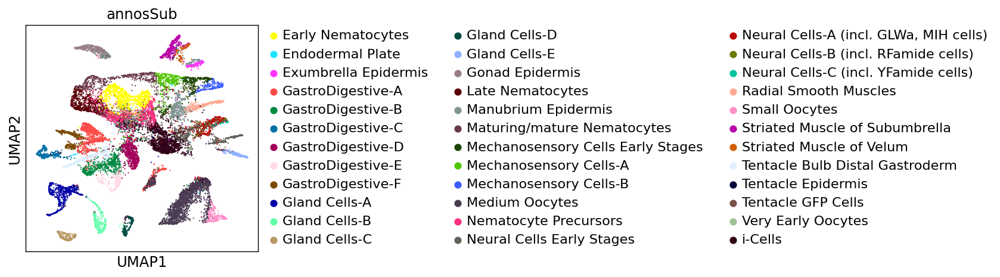

In [ ]:
sc.pl.umap(bus_stim_clus,color='annosSub')

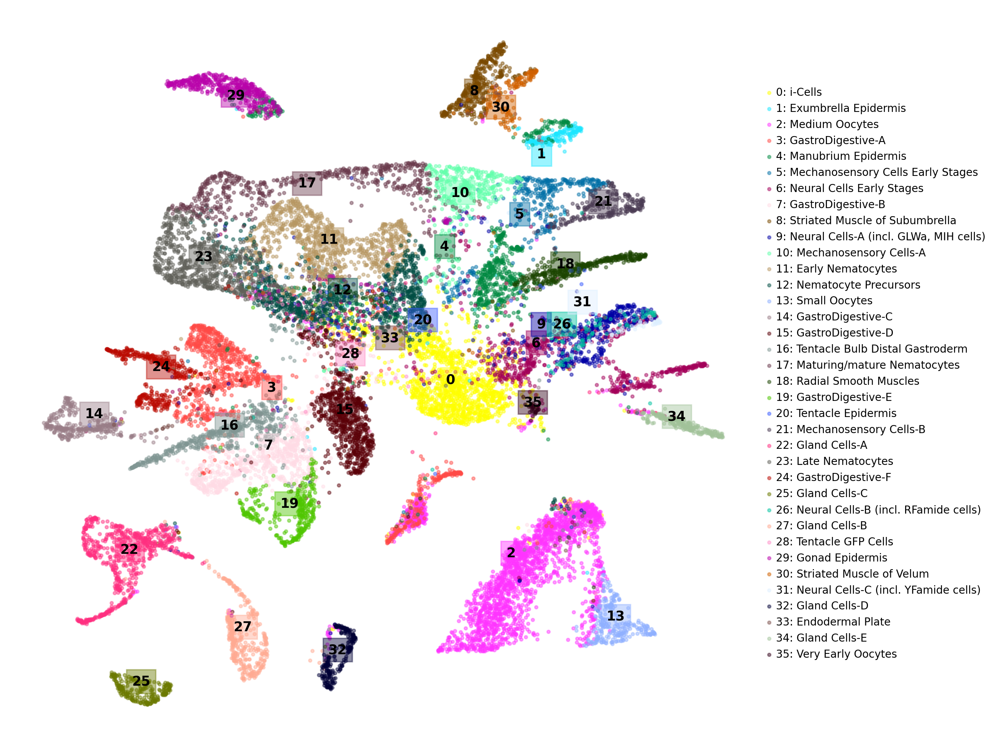

In [ ]:
colors = bus_stim_clus.uns['annosSub_colors']#bus_fs_clus.uns['annosSub_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_stim_clus.obs["cellRanger_louvain"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_stim_clus[bus_stim_clus.obs.cellRanger_louvain.isin([cluster]),:].obsm["X_umap"]
    text = list(bus_stim_clus[bus_stim_clus.obs.cellRanger_louvain.isin([cluster]),:].obs.annosSub)[0]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=str(cluster)+': '+text,s=5)
    ax.annotate(name,
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=10, weight='bold',
             color="black",
               backgroundcolor=cmap[idx])


ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False)
ax.set_axis_off()
plt.savefig('36ClusAtlas_Stim.pdf')
plt.show()

In [ ]:
#Subsample for clusters > 100 in size
#Subsample from full dataset, across each cluster
def subSample(adata):
  groups = np.unique(adata.obs['cellRanger_louvain'])
  subSample = 100
  cellNames = np.array(adata.obs_names)

  allCells = []
  for i in groups:
      #subSample =  clusSize[i] # Uncomment if not looking at similar scale cluster sizes

      cells = np.array(list(adata.obs['cellRanger_louvain'].isin([i])))
      cellLocs = list(np.where(cells)[0])

      if len(cellLocs) > 100:
      #Take all cells if < subSample
        choice = random.sample(cellLocs,subSample)
      else:
        choice = cellLocs

      pos = list(choice)
      #print(len(pos))

      allCells += list(cellNames[pos])


  sub = adata[allCells,:]
  return sub

In [ ]:
# #Filtered list of top markers
topMarkers = pd.read_csv('D1.1809',sep=",")
#topMarkers.head()

topMarkers = topMarkers[0:51]

topGenes = []
names = []
var_groups = []
var_labels = []
ind = 0
#n_genes = 2
for i in np.unique(topMarkers.clus):
  sub = topMarkers[topMarkers.clus == i]
  #sub.sort_values(by='padj',ascending=True)

  #noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(sub.markerGene)
  names += list(sub.annot)

  var_groups += [(ind,ind+len(list(sub.annot))-1)]
  var_labels += [str(int(i))] #make i from clusNameDict[i]
  ind += len(list(sub.annot))


In [ ]:
bus_stim_clus.obs['cellRanger_louvain'] = [str(i) for i in bus_stim_clus.obs['cellRanger_louvain']]
bus_stim_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_stim_clus.obs['cellRanger_louvain'])
#Create dendrogram for subclusters
sc.tl.dendrogram(bus_stim_clus,'cellRanger_louvain',linkage_method='ward')
bus_stim_clus.uns["dendrogram_cellRanger_louvain"] = bus_stim_clus.uns["dendrogram_['cellRanger_louvain']"]

bus_stim_clusSub = subSample(bus_stim_clus)

#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')
sc.pp.filter_cells(bus_stim, min_counts=1)
sc.pp.filter_genes(bus_stim, min_counts=1)

bus_stim = bus_stim[bus_stim_clusSub.obs_names,:]
bus_stim.obs['cellRanger_louvain'] = bus_stim_clusSub.obs['cellRanger_louvain']
bus_stim.uns['cellRanger_louvain_colors'] = bus_stim_clus.uns['annosSub_colors']
bus_stim.uns["dendrogram_cellRanger_louvain"] = bus_stim_clusSub.uns["dendrogram_cellRanger_louvain"]


bus_stim = bus_stim[:,topGenes]
bus_stim.var['names'] = names

sc.pp.log1p(bus_stim)

sc.set_figure_params(scanpy=True, fontsize=30,dpi=150)
sc.pl.heatmap(bus_stim,names,groupby='cellRanger_louvain',dendrogram=True,show_gene_labels=True,cmap='PuBuGn',use_raw = False,
                var_group_positions=var_groups,var_group_labels=var_labels,figsize = (30,30),swap_axes=True,standard_scale='var',
              gene_symbols='names',save='stimAtlas.pdf')

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.var` of view, copying.


Jaccard Marker Overlap Comparison

In [ ]:
n=100
bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.tl.rank_genes_groups(bus_stim_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')
sc.tl.rank_genes_groups(bus_fs_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')

In [ ]:
#Show pairwise overlap in top 100 names between all clusters, 36x36 grid
#https://stackoverflow.com/questions/52408910/python-pairwise-intersection-of-multiple-lists-then-sum-up-all-duplicates

clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

busStim = [[]]*len(clus) #np array of top 100 genes for each of 36 clusters
busFS = [[]]*len(clus)#np array of top 100 genes for each of 36 clusters

for c in clus:
  busStim[c] =  list(bus_stim_clus.uns['rank_genes_groups']['names'][str(c)])
  busFS[c] = list(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)])


In [ ]:
from itertools import combinations_with_replacement

#Changed to calculate Jaccard Index
def intersect(i,j):
  return len(set(busStim[i]).intersection(busFS[j]))/len(set(busStim[i]).union(busFS[j]))

def pairwise(clus):
  # Initialise precomputed matrix (num of clusters, 36x36)
  precomputed = np.zeros((len(clus),len(clus)), dtype='float')
  # Initialise iterator over objects in X
  iterator = combinations_with_replacement(range(0,len(clus)), 2)
  # Perform the operation on each pair
  for i,j in iterator:
    precomputed[i,j] = intersect(i,j)
  # Make symmetric and return
  return precomputed + precomputed.T - np.diag(np.diag(precomputed))


In [ ]:
pairCorrs = pairwise(clus)

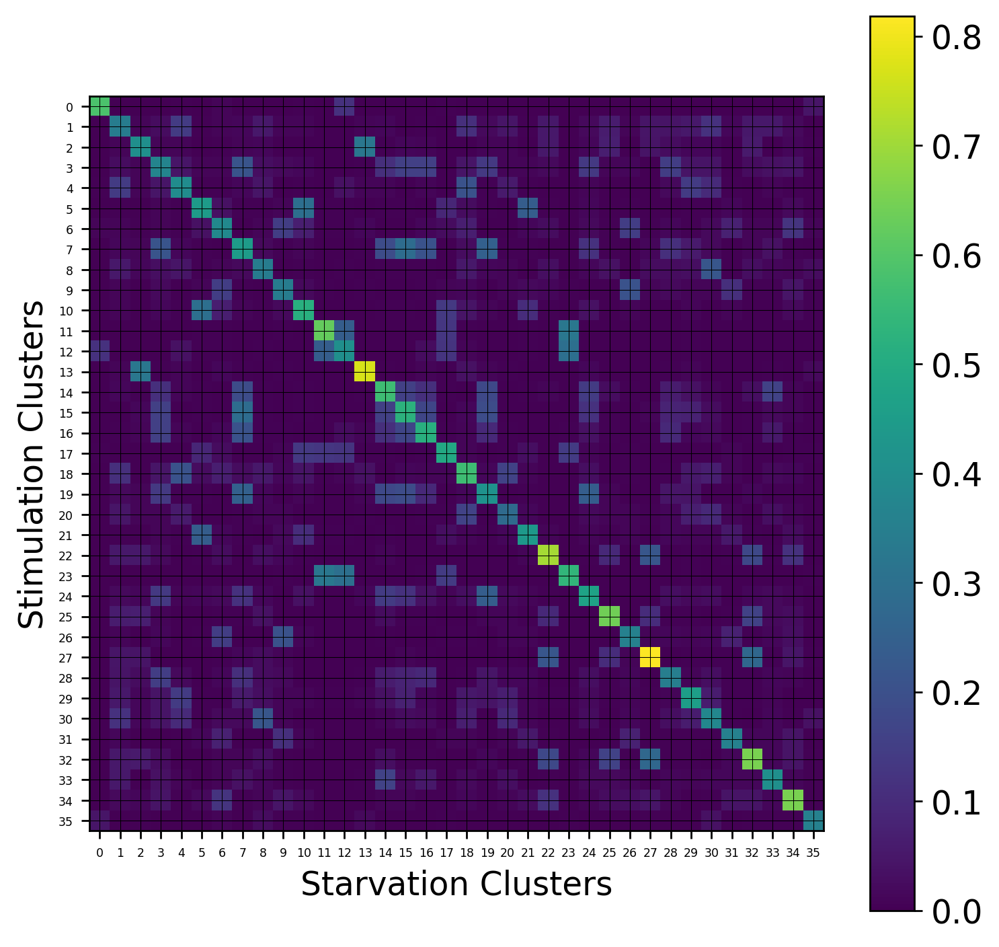

In [ ]:
plt.figure(figsize=(7,7))
plt.imshow(pairCorrs, cmap='viridis')
plt.colorbar()
plt.xlabel('Starvation Clusters')
plt.ylabel('Stimulation Clusters')

plt.xticks(np.arange(0, 36, 1),fontsize=5)
plt.yticks(np.arange(0, 36, 1),fontsize=5)
plt.grid(color='black',linewidth=0.3)
plt.show()

#### **Neighbor Score Plots**

Look at the density neighbors for each cell from the different perturbation conditions

In [ ]:
#Calculate number of neighbors (out of top 15) with same starvation condition
#Input adata object and if score is for fed or starved (True or False)
def neighborScores(adata,conditionBool):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names

    #get condition observation for this cell
    cellObs = adata.obs['condition'][cellNames[i]]

    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['condition'][l]

    # count # in 'fed' observations == cell obs
    count = 0
    #if cellObs == conditionBool:
    for j in obs:
      if j == conditionBool:
        count += 1


    counts += [count]

  print(len(counts))

  return counts

18921


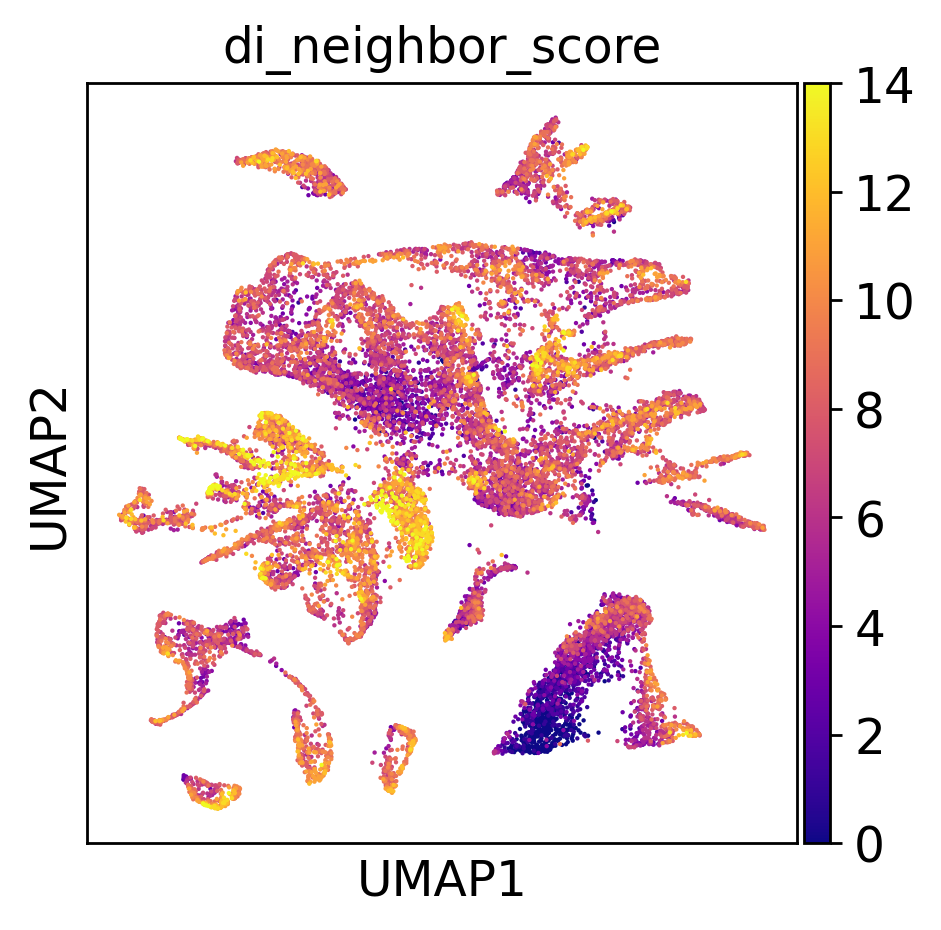

In [ ]:
bus_stim_clus.obs['di_neighbor_score'] = neighborScores(bus_stim_clus,'DI')
sc.pl.umap(bus_stim_clus,color='di_neighbor_score',color_map='plasma')


18921


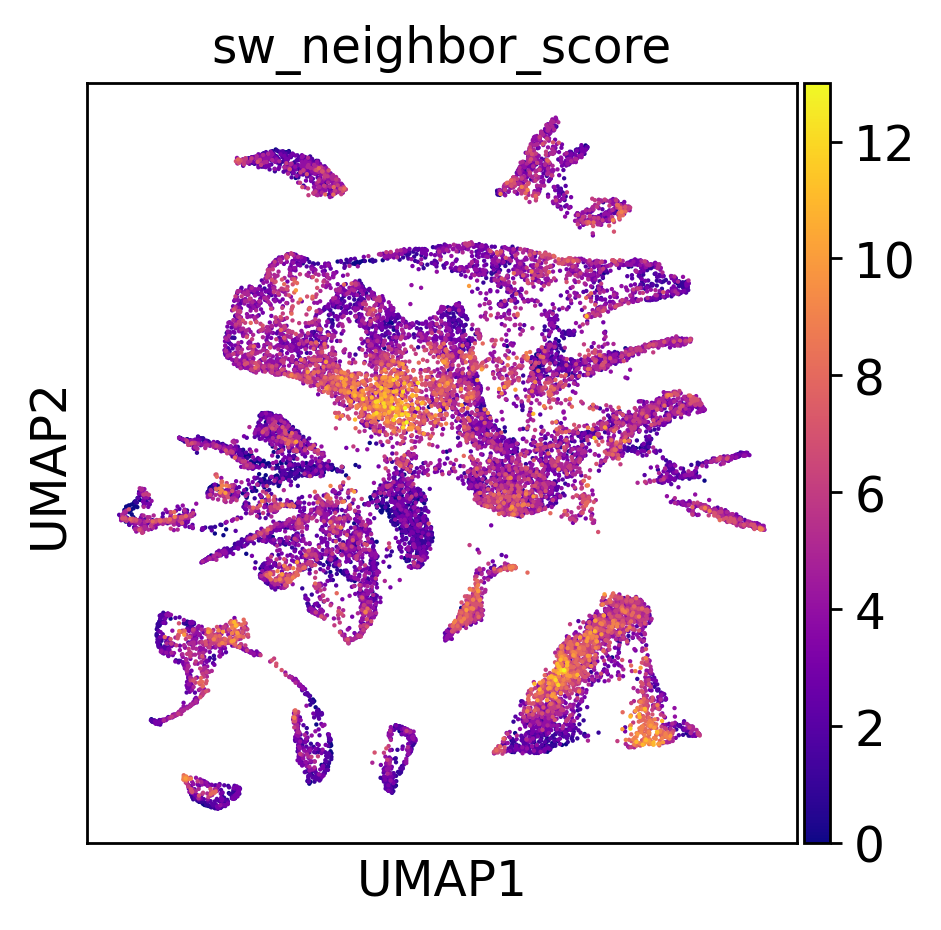

In [ ]:
bus_stim_clus.obs['sw_neighbor_score'] = neighborScores(bus_stim_clus,'SW')
sc.pl.umap(bus_stim_clus,color='sw_neighbor_score',color_map='plasma')


18921


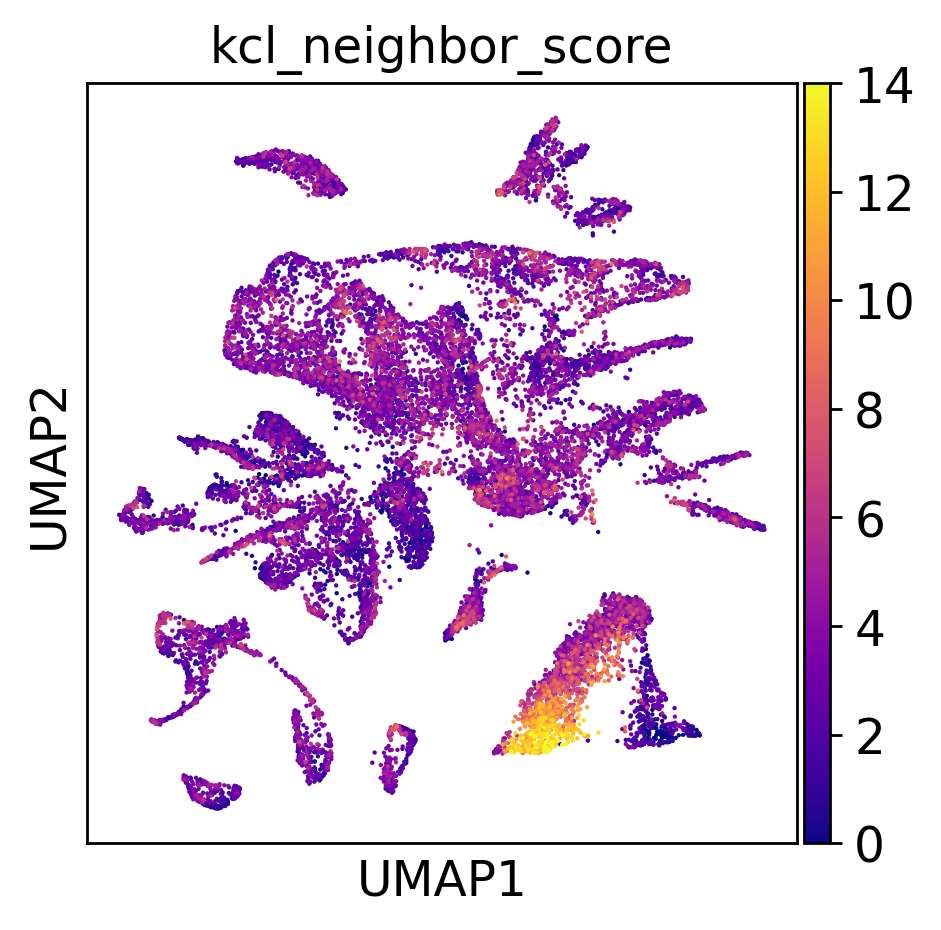

In [ ]:
bus_stim_clus.obs['kcl_neighbor_score'] = neighborScores(bus_stim_clus,'KCl')
sc.pl.umap(bus_stim_clus,color='kcl_neighbor_score',color_map='plasma')


#### **Violin Plots for DE Genes**

Look at expression profiles for DE genes under the different perturbations

In [ ]:
bus_stim_clus

AnnData object with n_obs × n_vars = 18921 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'condition', 'orgID', 'cellRanger_louvain'
    var: 'n_counts', 'mean', 'std'
    uns: 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'condition_colors', 'louvain', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
deGenes.head()

,Unnamed: 0,Unnamed: 0.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,1,XLOC_034855,0,KCl,3.353751e-21,8.719752e-20,-2.636114,NaN,NaN,NaN,NaN,NaN
1,1,2,XLOC_036454,0,KCl,1.106672e-18,2.877347e-17,-1.654651,NaN,NaN,['PTHR10127'],"['DISCOIDIN, CUB, EGF, LAMININ , AND ZINC META...","['GO:0007498,GO:0005488,GO:0008233,GO:0008237,..."
2,2,3,XLOC_001437,0,KCl,1.252213e-16,3.255753e-15,-1.739563,NaN,NaN,NaN,NaN,NaN
3,3,4,XLOC_008048,0,KCl,1.019006e-15,2.649416e-14,-1.785947,LOC102723665,PREDICTED: basic proline-rich protein-like [H...,['PTHR24637:SF339'],['CUTICLE COLLAGEN 79-RELATED'],"['GO:0032502,GO:0016337,GO:0007398,GO:0007498,..."
4,4,5,XLOC_044068,0,KCl,1.671318e-15,4.345426e-14,-1.664870,NaN,NaN,NaN,NaN,[nan]


In [ ]:
numGenes = []
posNeg = []
cluster = []
condition = []
fracGenes = []
genes = []

for i in np.unique(deGenes.Cluster):

  sub = deGenes[deGenes['Cluster'].isin([i])]
  subKCl = sub[sub['Condition'].isin(['KCl'])]
  subDI = sub[sub['Condition'].isin(['DI'])]

  numGenes += [sum(subKCl.log2FC > 0 ),sum(subDI.log2FC > 0 ),sum(subKCl.log2FC < 0 ),sum(subDI.log2FC < 0 )]
  genes += [list(subKCl.Genes[subKCl.log2FC > 0]),list(subDI.Genes[subDI.log2FC > 0]),list(subKCl.Genes[subKCl.log2FC < 0]),list(subDI.Genes[subDI.log2FC < 0])]
  fracGenes += [sum(subKCl.log2FC > 0 )/len(subKCl.log2FC),sum(subDI.log2FC > 0 )/len(subDI.log2FC),sum(subKCl.log2FC < 0 )/len(subKCl.log2FC),sum(subDI.log2FC < 0 )/len(subDI.log2FC)]
  posNeg += ['Up','Up','Down','Down']
  condition += ['KCl','DI','KCl','DI']
  cluster += [i]*4

upRegStats = pd.DataFrame()
upRegStats['Num'] = numGenes
upRegStats['Regulation'] = posNeg
upRegStats['Condition'] = condition
upRegStats['Cluster'] = cluster
upRegStats['Fraction'] = fracGenes
upRegStats['Genes'] = genes
upRegStats.head()


,Num,Regulation,Condition,Cluster,Fraction,Genes
0,8,Up,KCl,0,0.042553,"[XLOC_044226, XLOC_001220, XLOC_034299, XLOC_0..."
1,2,Up,DI,0,0.007353,"[XLOC_011505, XLOC_009193]"
2,180,Down,KCl,0,0.957447,"[XLOC_034855, XLOC_036454, XLOC_001437, XLOC_0..."
3,270,Down,DI,0,0.992647,"[XLOC_034855, XLOC_036454, XLOC_001437, XLOC_0..."
4,1,Up,KCl,1,0.125000,[XLOC_002790]


In [ ]:
test = upRegStats.groupby(['Cluster','Regulation'])['Num'].agg('sum')
test

Cluster  Regulation
0        Down           450
         Up              10
1        Down            14
         Up               5
2        Down           134
         Up             714
3        Down            40
         Up              79
4        Down            23
         Up              53
5        Down          1273
         Up              70
6        Down            47
         Up               6
7        Down             2
         Up              34
8        Down            21
         Up               6
9        Down            23
         Up              11
10       Down            54
         Up              13
11       Down            11
         Up              12
12       Down            10
         Up               5
13       Down            10
         Up              87
14       Down             1
         Up              23
15       Down            43
         Up              29
16       Down           172
         Up              33
17       Down           111


In [ ]:
print('No. DE Genes: ',len(np.unique(deGenes.Genes)))

No. DE Genes:  2311


In [ ]:
#Get log version of p-values for plotting
deGenes['logPadj'] = -np.log10(deGenes['padj'])
deGenes["No. Cell Types"] = deGenes['Genes'].apply(lambda x: int(deGenes.value_counts('Genes')[x]))



Filter for noisy padj/fc value (when one value is very small, close to zero)

In [ ]:
sub = deGenes[abs(deGenes['log2FC'])<10]
sub = sub[abs(sub['logPadj'])<40]

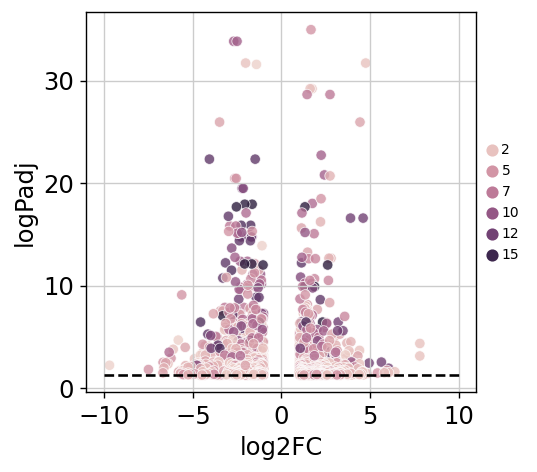

In [ ]:

sub["val"] =sub['Genes'].apply(lambda x: "green" if x in ['XLOC_006558','XLOC_006729','XLOC_000601'] else "blue")

ax = sns.scatterplot(data=sub , x='log2FC',y='logPadj',hue="No. Cell Types",alpha=0.8)
ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False)
ax.hlines([1.3], -10, 10, linestyles='dashed', colors='black')


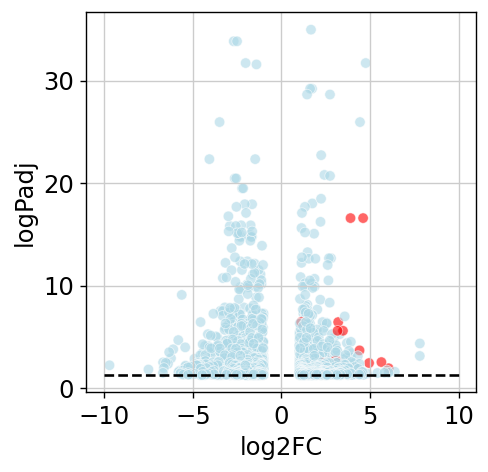

In [ ]:

ax = sns.scatterplot(data=sub , x='log2FC',y='logPadj',hue='val',alpha=0.6,legend=False,palette={"green":"red","blue":"lightblue"})
ax.hlines([1.3], -10, 10, linestyles='dashed', colors='black')


DE Genes in Neurons (Cluster 9, Neural Cells-A)

In [ ]:
neurGenes = ["XLOC_006558","XLOC_034234","XLOC_003785","XLOC_001759"]

(0.0, 11.0)

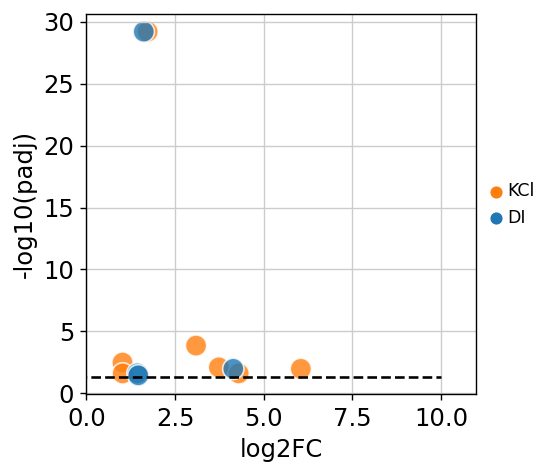

In [ ]:
sub9 =  deGenes[ deGenes.Cluster == 9]
sub9  = sub9[abs(sub9['logPadj'])<40]

#filter for only upregulated genes
sub9  = sub9[sub9['log2FC']>0]

sub9["XLOC_006558"] =sub9['Genes'].apply(lambda x: "green" if x in ['XLOC_006558'] else "blue")
sub9["XLOC_034234"] =sub9['Genes'].apply(lambda x: "green" if x in ['XLOC_034234'] else "blue")
sub9["XLOC_003785"] =sub9['Genes'].apply(lambda x: "green" if x in ['XLOC_003785'] else "blue")
sub9["XLOC_001759"] =sub9['Genes'].apply(lambda x: "green" if x in ['XLOC_001759'] else "blue")

ax = sns.scatterplot(data=sub9 , x='log2FC',y='logPadj',hue="Condition",alpha=0.8,palette={'KCl':sns.color_palette()[1],'DI':sns.color_palette()[0]},s=150)
ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 10},frameon=False)
ax.hlines([1.3], -10, 10, linestyles='dashed', colors='black')
plt.ylabel('-log10(padj)')
plt.xlim(xmin=0)


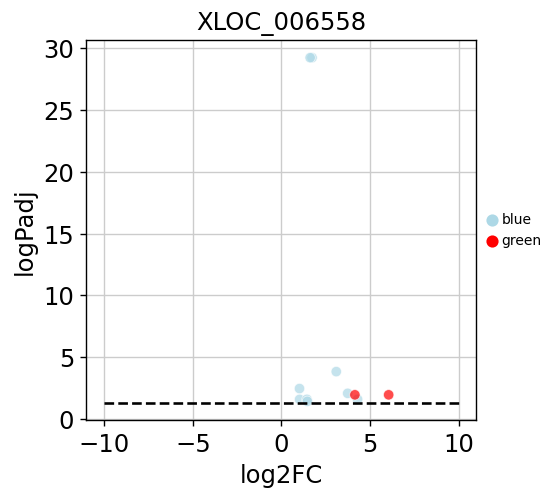

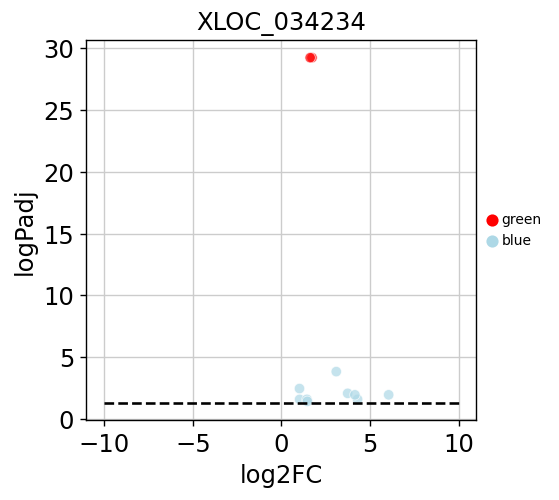

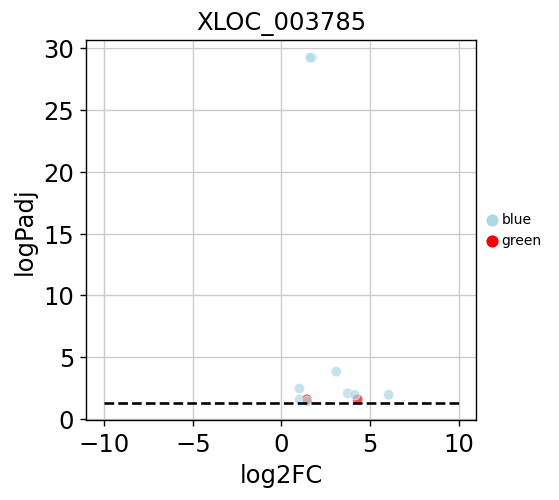

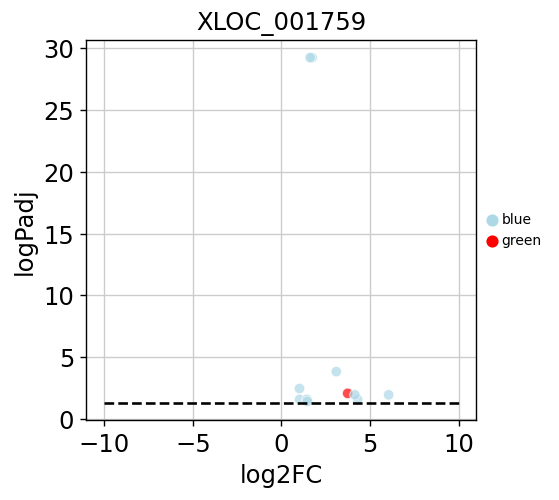

In [ ]:
for n in neurGenes:
  ax = sns.scatterplot(data=sub9 , x='log2FC',y='logPadj',hue=n,alpha=0.7,palette={"green":"red","blue":"lightblue"})
  ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False)
  ax.hlines([1.3], -10, 10, linestyles='dashed', colors='black')
  plt.title(n)
  plt.show()


In [ ]:
print(sum(upRegStats.Num[upRegStats.Regulation == 'Up'])/sum(upRegStats.Num))
print(sum(upRegStats.Num[upRegStats.Regulation == 'Down'])/sum(upRegStats.Num))

0.3327526132404181
0.6672473867595818


In [ ]:
print(len(np.unique(deGenes.Genes)))

2311


What does upregulation and downregulation look like across the cell types?

In [ ]:
upRegStats[upRegStats['Cluster'] == 9]

,Num,Regulation,Condition,Cluster
36,7,Up,KCl,9
37,4,Up,DI,9
38,10,Down,KCl,9
39,13,Down,DI,9


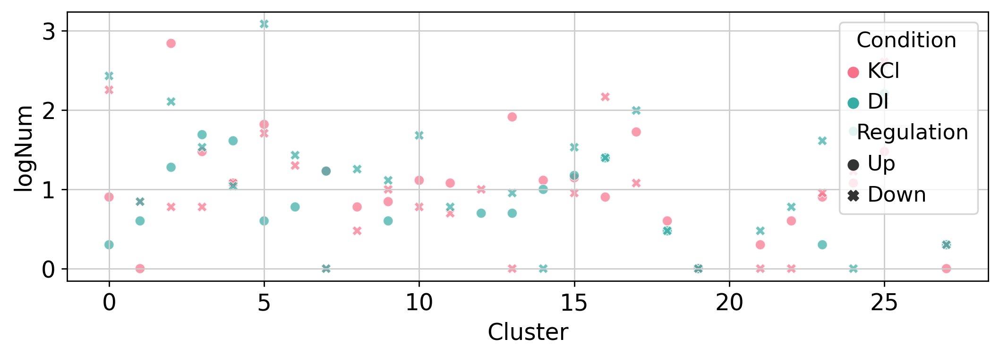

In [ ]:
plt.figure(figsize=(10,3))
upRegStats['logNum'] = np.log10(upRegStats['Num'])
sns.scatterplot(data=upRegStats,x='Cluster',y='logNum',hue='Condition',style='Regulation',palette="husl",alpha=0.7)

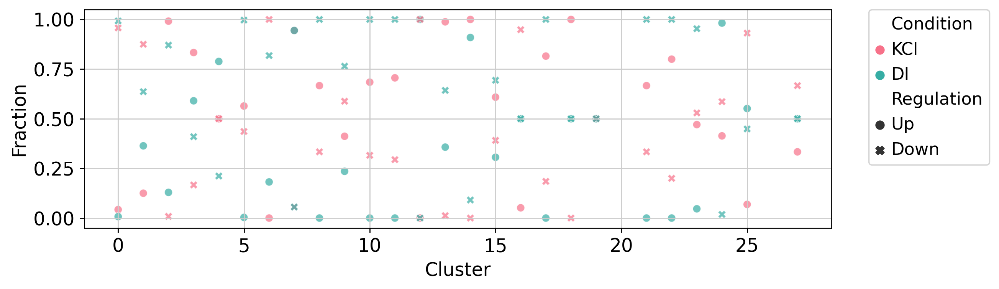

In [ ]:
plt.figure(figsize=(10,3))
upRegStats['Frac'] = np.log10(upRegStats['Num'])
sns.scatterplot(data=upRegStats,x='Cluster',y='Fraction',hue='Condition',style='Regulation',palette="husl",alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1),borderaxespad=0)

In [ ]:
neurGenes = list(deGenes[deGenes['Cluster'].isin([9])].Genes)
projGenes = list(deGenes[deGenes['Cluster'].isin([6])].Genes)

In [ ]:
#Neural cells-A DE Genes of interest
genes = ['XLOC_006558','XLOC_034234','XLOC_003785','XLOC_001759']

In [ ]:
deGenes[deGenes.Genes.isin(genes) & deGenes.Cluster.isin([9]) ]

,Unnamed: 0,Unnamed: 0.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,logPadj,No. Cell Types
2981,2981,2982,XLOC_034234,9,KCl,6.086468e-30,1.582482e-28,1.724350,NaN,NaN,NaN,NaN,NaN,29.215635,2
2991,2991,2992,XLOC_001759,9,KCl,8.110452e-03,2.108717e-01,3.733802,NaN,NaN,"['PTHR12661:SF5', 'PTHR12661']","['SUPPRESSOR OF SWI4 1 HOMOLOG', 'PETER PAN-RE...","['GO:0016070,GO:0006139,GO:0016072,GO:0008152,...",2.090955,2
2992,2992,2993,XLOC_006558,9,KCl,1.067907e-02,2.776558e-01,6.046193,NaN,NaN,NaN,NaN,[nan],1.971467,12
2994,2994,2995,XLOC_003785,9,KCl,2.491601e-02,6.478162e-01,4.293081,NaN,NaN,NaN,NaN,NaN,1.603522,2
3000,3000,3001,XLOC_034234,9,DI,6.086468e-30,1.582482e-28,1.617067,NaN,NaN,NaN,NaN,NaN,29.215635,2
3006,3006,3007,XLOC_001759,9,DI,8.110452e-03,2.108717e-01,-1.891130,NaN,NaN,"['PTHR12661:SF5', 'PTHR12661']","['SUPPRESSOR OF SWI4 1 HOMOLOG', 'PETER PAN-RE...","['GO:0016070,GO:0006139,GO:0016072,GO:0008152,...",2.090955,2
3007,3007,3008,XLOC_006558,9,DI,1.067907e-02,2.776558e-01,4.140999,NaN,NaN,NaN,NaN,[nan],1.971467,12
3009,3009,3010,XLOC_003785,9,DI,2.491601e-02,6.478162e-01,1.436551,NaN,NaN,NaN,NaN,NaN,1.603522,2


Plot Gene Expression for Neurons in 9 (Violin Plots to show distribution of expression)

In [ ]:
clus9 = bus_stim_clus[bus_stim_clus.obs['cellRanger_louvain'].isin([9])]

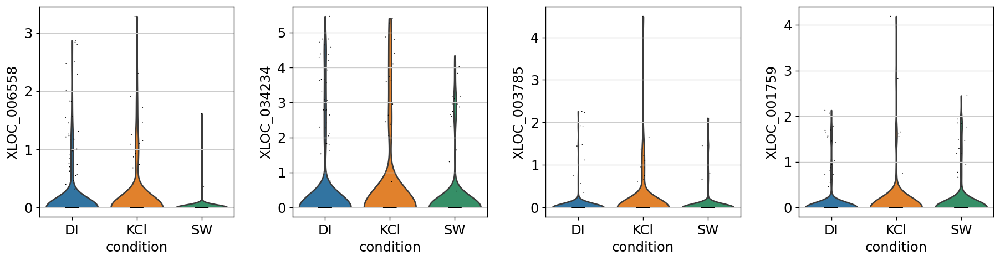

In [ ]:
sc.pl.violin(clus9,keys=genes, groupby='condition')

In [ ]:

# #Genes: NA, EF-HAND CALCIUM-BINDING DOMAIN-CONTAINING PROTEIN 4B, NA, ['SUPPRESSOR OF SWI4 1 HOMOLOG', 'PETER PAN-RELATED'], C-type Lectin likes (QPCR), NA
# upReg9kcl = list(upRegStats.Genes[upRegStats.Regulation.isin(['Up']) & upRegStats.Cluster.isin([9])])[0][:-1]
# sc.pl.violin(clus9,keys=upReg9kcl, groupby='condition')

# #Genes: last one - ['VITELLOGENIN-RELATED']
# upReg9DI  = list(upRegStats.Genes[upRegStats.Regulation.isin(['Up']) & upRegStats.Cluster.isin([9])])[1]
# sc.pl.violin(clus9,keys=upReg9DI, groupby='condition')

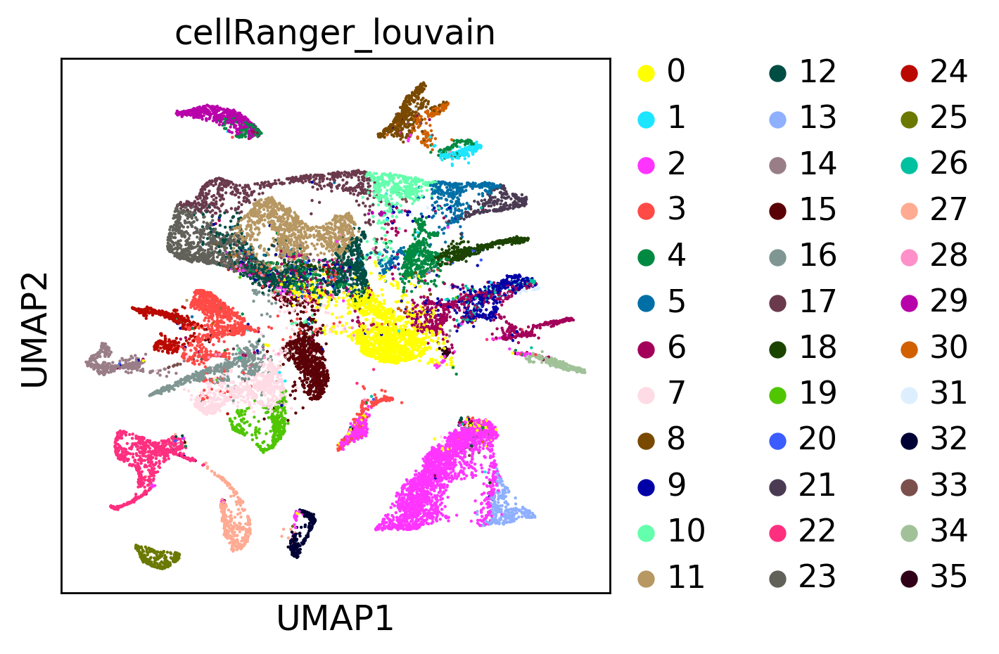

In [ ]:
sc.pl.umap(bus_stim_clus,color=['cellRanger_louvain'])

In [ ]:
# clus5 = bus_stim_clus[bus_stim_clus.obs['cellRanger_louvain'].isin([5])]

# #Piwi-like, DNA-directed RNA polymerase, Cilia/Flagella Associated Protein **
# sc.pl.violin(clus5,keys=['XLOC_007915','XLOC_005790','XLOC_004521'], groupby='condition')

Look at more Global DE Gene candidates

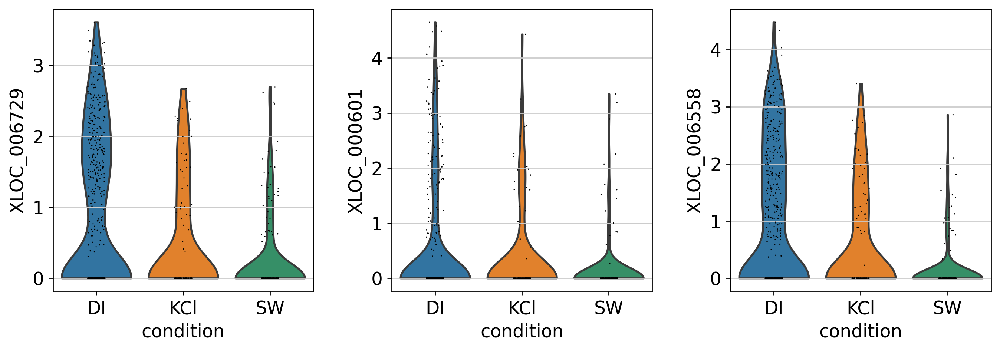

In [ ]:
clus7 = bus_stim_clus[bus_stim_clus.obs['cellRanger_louvain'].isin([7])]
sc.pl.violin(clus7,keys=['XLOC_006729','XLOC_000601','XLOC_006558'], groupby='condition')

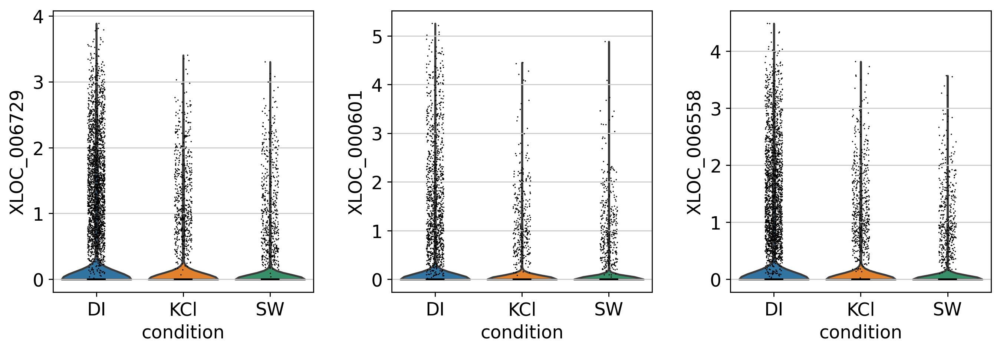

In [ ]:
sc.pl.violin(bus_stim_clus,keys=['XLOC_006729','XLOC_000601','XLOC_006558'], groupby='condition')

In [ ]:
genes2 = ['XLOC_006558','XLOC_006729','XLOC_000601']

In [ ]:
#Get cells in neuron pop, KCl and DI
louv = np.unique(bus_stim.obs['cellRanger_louvain'])
fcs = []
cond = []
gene = []
subpop = []
for l in louv:
  sub = bus_stim[bus_stim.obs['cellRanger_louvain'].isin([l])]

#Get avg expression of genes in SW
  subSW = sub[sub.obs['condition']=='SW']
  subKCl = sub[sub.obs['condition']=='KCl']
  subDI = sub[sub.obs['condition']=='DI']

#Get log2FC for KCl and DI cells
  for g in genes2:
    dense = subSW[:,g].X.todense()
    m = np.mean(dense)
    #k = np.mean(subKCl[:,g].X.todense())
    #d = np.mean(subDI[:,g].X.todense())


    fc = np.log2(subKCl[:,g].X.todense()/m)
    fc  = [i[0,0] for i in fc]
    fcs += fc
    cond += ['KCl']*len(fc)
    gene += [g]*len(fc)
    subpop += [l]*len(fc)

    fc = np.log2(subDI[:,g].X.todense()/m)
    fc  = [i[0,0] for i in fc]
    fcs += fc
    cond += ['DI']*len(fc)
    gene += [g]*len(fc)
    subpop += [l]*len(fc)


allVals = pd.DataFrame()
allVals['log2FC'] = fcs
allVals['condition'] = cond
allVals['gene'] = gene
allVals['subpop'] = subpop
allVals.head()
#Add values, condition , gene, subpopulation

,log2FC,condition,gene,subpop
0,-inf,KCl,XLOC_006558,0
1,3.237039,KCl,XLOC_006558,0
2,-inf,KCl,XLOC_006558,0
3,-inf,KCl,XLOC_006558,0
4,-inf,KCl,XLOC_006558,0


In [ ]:
# def repInf(i):
#   if i == -np.inf or i == np.inf:
#     return 0
#   else:
#     return i

# allVals.log2FC = [repInf(i) for i in allVals.log2FC]
# allVals.log2FC

allVals = allVals[abs(allVals.log2FC) != np.inf]

In [ ]:
allVals.head()

,log2FC,condition,gene,subpop
1,3.237039,KCl,XLOC_006558,0
5,3.237039,KCl,XLOC_006558,0
6,3.237039,KCl,XLOC_006558,0
37,4.237039,KCl,XLOC_006558,0
38,4.237039,KCl,XLOC_006558,0


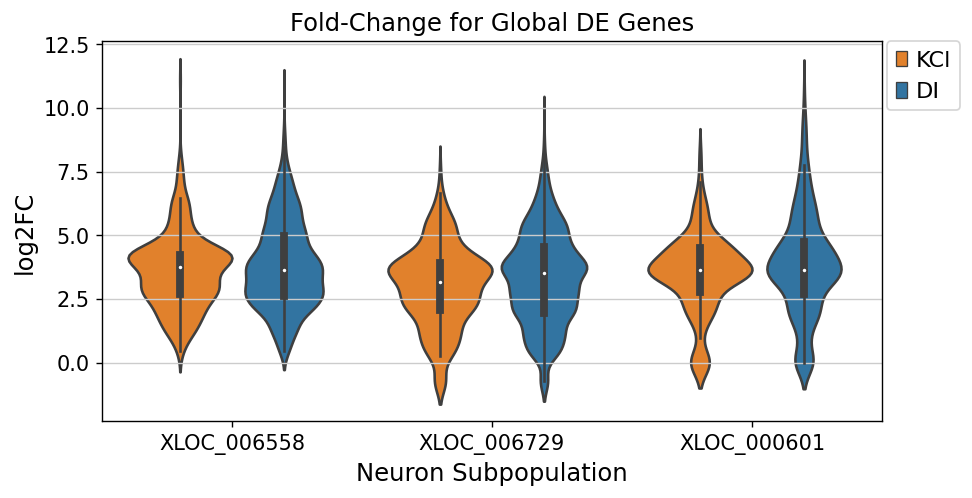

In [ ]:
#for g in genes:
  #subVal = allVals[allVals.gene == g]
plt.figure(figsize=(8,4))
my_pal = {"DI": sns.color_palette()[0], "KCl": sns.color_palette()[1]}

ax = sns.violinplot(x='gene',y='log2FC',hue='condition',data=allVals,palette=my_pal )

plt.ylabel("log2FC")
plt.xlabel("Neuron Subpopulation")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Fold-Change for Global DE Genes')
plt.legend(bbox_to_anchor=(1.10, 1),borderaxespad=0)
plt.show()


#### **Neuron Subpopulations**

Apply subpopulation labels to closest neighbors in stim dataset

In [ ]:
#Make X_pca with merged, use top n PC's
def getPredLabels(overlap_fs,overlap_combo, n_PC):

    numFS = len(overlap_fs.obs_names)
    X_train = overlap_combo.obsm['X_pca'][0:numFS,0:n_PC]

    #X_pca at stim rows = X_test
    X_test = overlap_combo.obsm['X_pca'][numFS:,0:n_PC]

    #y_train is f/s louvain labels
    y_train = overlap_fs.obs['louvain_neur']

    #Fit and predict
    classifier = KNeighborsClassifier(n_neighbors=15)
    classifier.fit(X_train, y_train)

    y_pred = classifier.predict(X_test)

    labels = list(y_train)+list(y_pred)

    print(len(labels),' labels created')

    return labels

In [ ]:
fs_neuron = anndata.read('D1.1804')

In [ ]:
fs_neuron

AnnData object with n_obs × n_vars = 1387 × 2000
    obs: 'batch', 'cellRanger_louvain', 'fed', 'n_counts', 'louvain_neur', 'test_louvain'
    var: 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cellRanger_louvain_colors', 'hvg', 'louvain', 'louvain_neur_colors', 'neighbors', 'pca', 'rank_genes_groups', 'test_louvain_colors', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')
bus_stim = bus_stim[bus_stim_clus.obs_names,]
#Transfer info from embedded version
bus_stim.obs['cellRanger_louvain'] = pd.Categorical(bus_stim_clus.obs['cellRanger_louvain'])
bus_stim.obs['condition'] = pd.Categorical(bus_stim_clus.obs['condition'])

Trying to set attribute `.obs` of view, copying.


Trying to set attribute `.obs` of view, copying.


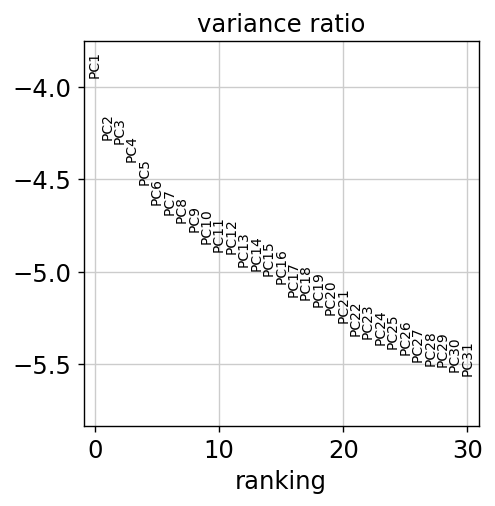

In [ ]:
#Neurons, start from raw counts + unfiltered genes
neurons = bus_stim[bus_stim.obs['cellRanger_louvain'].isin([31,26,6,9])]
sc.pp.filter_cells(neurons, min_counts=0)
sc.pp.filter_genes(neurons, min_counts=0)

sc.pp.normalize_per_cell(neurons, counts_per_cell_after=1e4)

neurons_copy = neurons.copy()
sc.pp.log1p(neurons)
neurons.raw = sc.pp.log1p(neurons_copy, copy=True)

# sc.pp.scale(raw_overlap_combo, max_value=10)
sc.pp.highly_variable_genes(neurons,n_top_genes=2000,n_bins=50)

neurons = neurons[:,neurons.var['highly_variable']]

sc.pp.scale(neurons, max_value=10)

sc.tl.pca(neurons, n_comps=60)
sc.pl.pca_variance_ratio(neurons, log=True)

#applyNCAEmbed(neurons,neurons.obs['knn_clus'])

sc.pp.neighbors(neurons,n_neighbors=15, n_pcs=15) #n_neighbors=5, n_pcs=15,use_rep='X_nca'
sc.tl.louvain(neurons,resolution=1,key_added='louvain_neur',random_state=42)#Clustering algorithm,resolution=0.5

In [ ]:
#sc.tl.louvain(neurons,resolution=2.5,key_added='louvain_neur',random_state=42)
neurons

AnnData object with n_obs × n_vars = 1598 × 2000
    obs: 'batch', 'cellRanger_louvain', 'condition', 'n_counts', 'louvain_neur'
    var: 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'louvain'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
#Get intersection of var names between the two (making overlap_combo)
overlap = list(set(fs_neuron.var_names).intersection(neurons.var_names))

overlap_fs = fs_neuron[:,overlap]

overlap_stim = neurons[:,overlap]


#Merge datasets
overlap_fs.obs_names = [i+'_fs' for i in overlap_fs.obs_names]
overlap_stim.obs_names = [i+'_ieg' for i in overlap_stim.obs_names]

origin = list(np.repeat('FS',len(overlap_fs.obs_names))) + list(np.repeat('Stim',len(overlap_stim.obs_names)))
overlap_combo = overlap_fs.concatenate(overlap_stim,join='outer', index_unique=None)

overlap_combo.obs['cell_origin'] = pd.Categorical(origin)
sc.pp.scale(overlap_combo, max_value=10)

#Do PCA on merged dataset + plot variance explained
sc.tl.pca(overlap_combo, n_comps=60)
#sc.pl.pca_variance_ratio(overlap_combo, log=True)

#overlap_combo

labels = getPredLabels(overlap_fs,overlap_combo,n_PC = 60)

overlap_combo.obs['knn_clus'] = pd.Categorical(labels)


2985  labels created


In [ ]:
neurons.obs['louvain_neur'] = pd.Categorical(overlap_combo[overlap_combo.obs['cell_origin'] == 'Stim'].obs['knn_clus'])

Get Avg Fold Change for Subpops of Interest

In [ ]:
neurons_copy.obs['louvain_neur'] = neurons.obs['louvain_neur']

In [ ]:
genes = ['XLOC_006558','XLOC_034234','XLOC_003785','XLOC_001759']
genes

['XLOC_006558', 'XLOC_034234', 'XLOC_003785', 'XLOC_001759']

In [ ]:
neurons_copy

AnnData object with n_obs × n_vars = 1598 × 46716
    obs: 'batch', 'cellRanger_louvain', 'condition', 'n_counts', 'louvain_neur'
    var: 'n_counts'

In [ ]:
#Get cells in neuron pop, KCl and DI
louv = np.unique(neurons_copy.obs['louvain_neur'])
fcs = []
cond = []
gene = []
subpop = []
for l in louv:
  sub = neurons_copy[neurons_copy.obs['louvain_neur'].isin([l])]

#Get avg expression of genes in SW
  subSW = sub[sub.obs['condition']=='SW']
  subKCl = sub[sub.obs['condition']=='KCl']
  subDI = sub[sub.obs['condition']=='DI']

#Get log2FC for KCl and DI cells
  for g in genes:
    dense = subSW[:,g].X.todense()
    m = np.mean(dense[dense>0])
    #k = np.mean(subKCl[:,g].X.todense())
    #d = np.mean(subDI[:,g].X.todense())


    fc = np.log2(subKCl[:,g].X.todense()/m)
    fc  = [i[0,0] for i in fc]
    fcs += fc
    cond += ['KCl']*len(fc)
    gene += [g]*len(fc)
    subpop += [l]*len(fc)

    fc = np.log2(subDI[:,g].X.todense()/m)
    fc  = [i[0,0] for i in fc]
    fcs += fc
    cond += ['DI']*len(fc)
    gene += [g]*len(fc)
    subpop += [l]*len(fc)


allVals = pd.DataFrame()
allVals['log2FC'] = fcs
allVals['condition'] = cond
allVals['gene'] = gene
allVals['subpop'] = subpop
allVals.head()
#Add values, condition , gene, subpopulation

,log2FC,condition,gene,subpop
0,-inf,KCl,XLOC_006558,0
1,-inf,KCl,XLOC_006558,0
2,-inf,KCl,XLOC_006558,0
3,-inf,KCl,XLOC_006558,0
4,-inf,KCl,XLOC_006558,0


In [ ]:
# def repInf(i):
#   if i == -np.inf or i == np.inf:
#     return 0
#   else:
#     return i

# allVals.log2FC = [repInf(i) for i in allVals.log2FC]
# allVals.log2FC

allVals = allVals[abs(allVals.log2FC) != np.inf]

In [ ]:
allVals.head()

,log2FC,condition,gene,subpop
10,1.031006,KCl,XLOC_006558,0
19,1.576773,KCl,XLOC_006558,0
21,-0.069834,KCl,XLOC_006558,0
36,-0.390890,KCl,XLOC_006558,0
42,1.918806,KCl,XLOC_006558,0


Plot fold changes in subpopulations

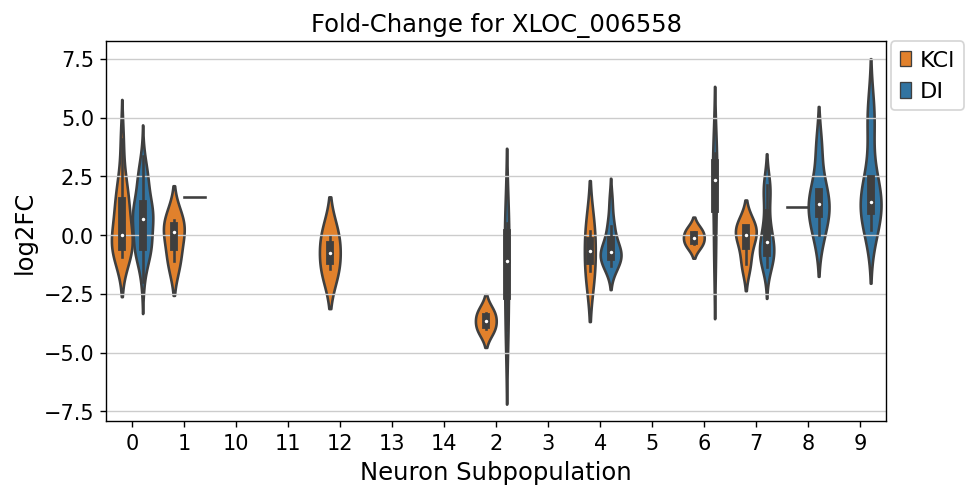

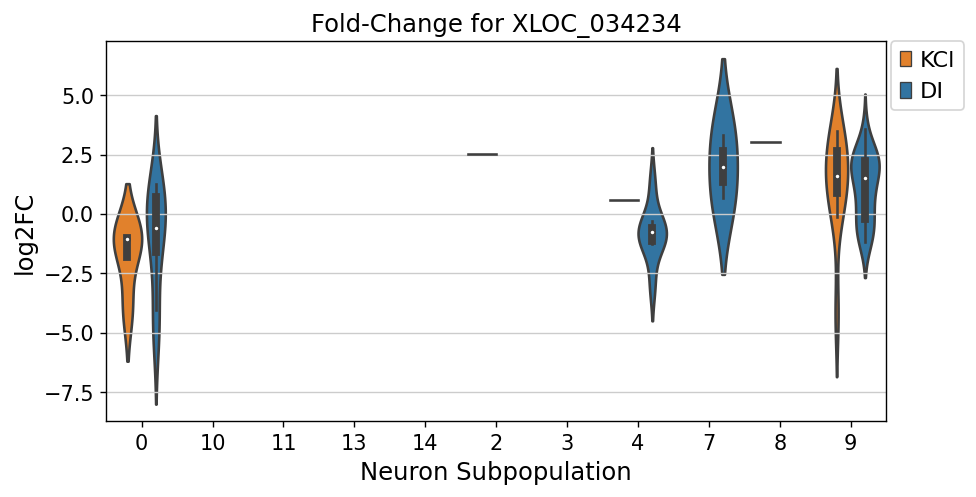

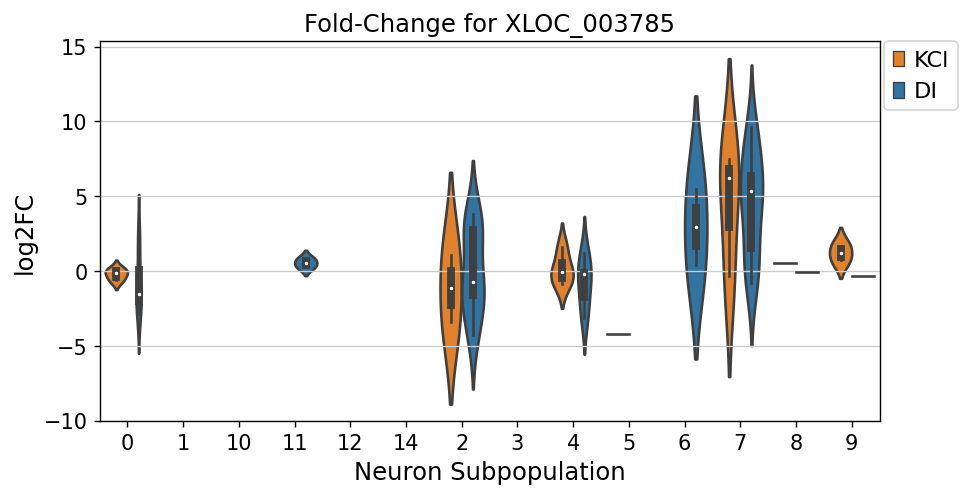

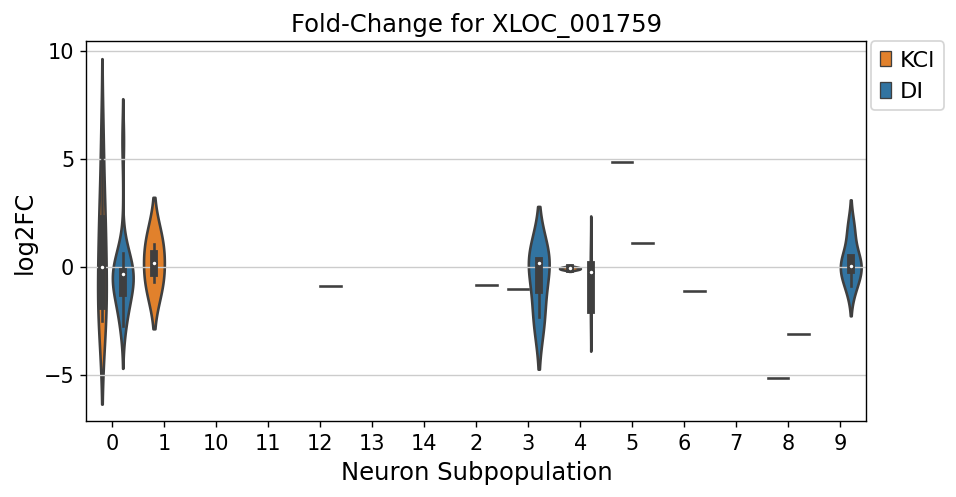

In [ ]:
for g in genes:
  subVal = allVals[allVals.gene == g]
  plt.figure(figsize=(8,4))
  my_pal = {"DI": sns.color_palette()[0], "KCl": sns.color_palette()[1]}

  ax = sns.violinplot(x='subpop',y='log2FC',hue='condition',data=subVal,palette=my_pal )

  plt.ylabel("log2FC")
  plt.xlabel("Neuron Subpopulation")
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)
  plt.title('Fold-Change for '+g)
  plt.legend(bbox_to_anchor=(1.10, 1),borderaxespad=0)
  plt.show()


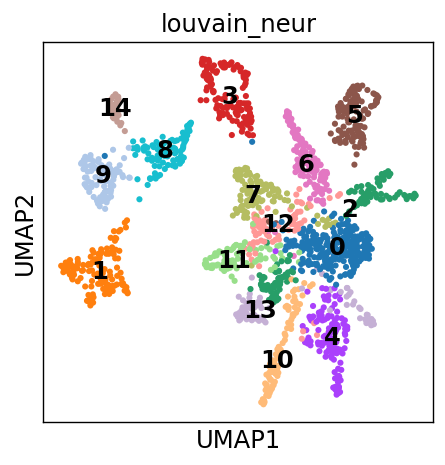

In [ ]:
sc.tl.umap(neurons,random_state=42,spread=2.5, min_dist=1)

neurons.obs['cellAtlasClusters'] = pd.Categorical(neurons.obs['cellRanger_louvain'] )
sc.pl.umap(neurons, color=['louvain_neur'],color_map='viridis',size=50,legend_loc='on data')

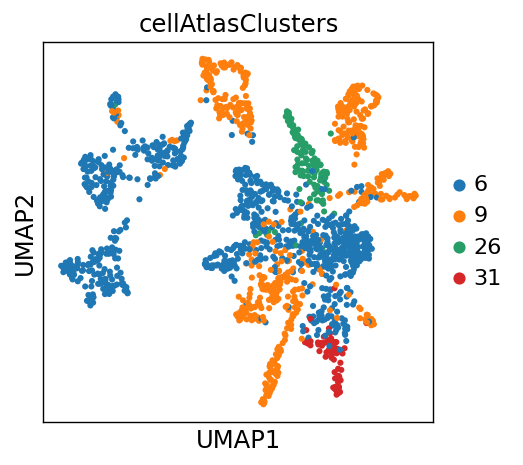

In [ ]:
sc.pl.umap(neurons, color=['cellAtlasClusters'],color_map='viridis',size=50)

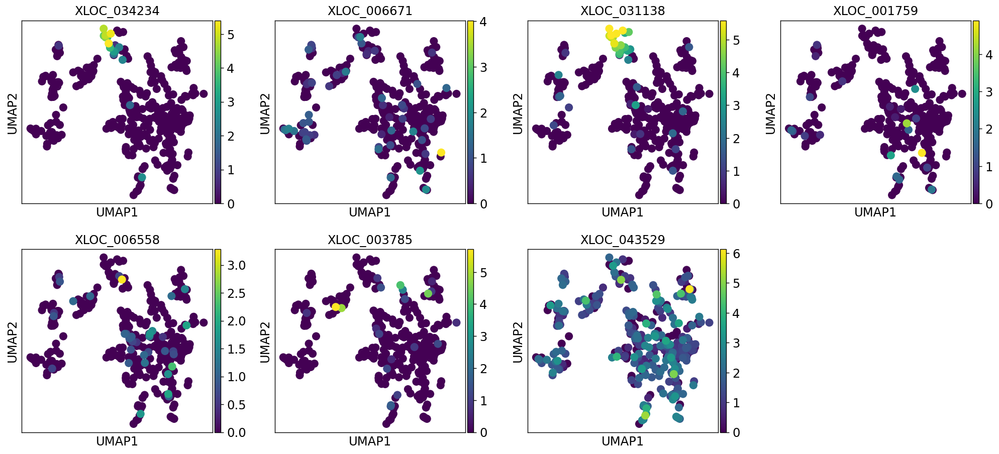

In [ ]:
kcl = neurons[neurons.obs['condition'] == 'KCl']
di = neurons[neurons.obs['condition'] == 'DI']
sc.pl.umap(kcl,color=upReg9kcl+['XLOC_043529'])
#sc.pl.umap(bus_stim_clus,color=upReg9DI)
#sc.pl.umap(bus_stim_clus,color=[color='cellRanger_louvain'])

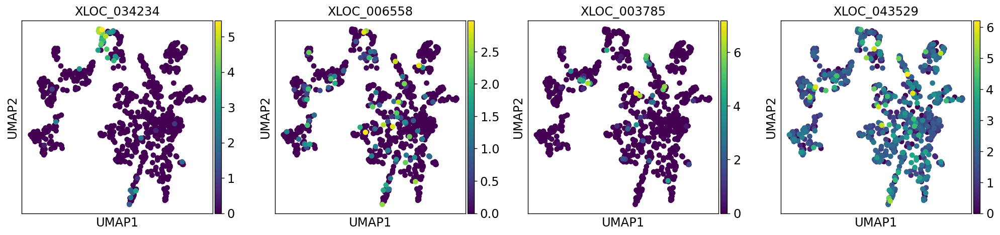

In [ ]:

sc.pl.umap(di,color=upReg9DI)
#sc.pl.umap(bus_stim_clus,color=upReg9DI)
#sc.pl.umap(bus_stim_clus,color=[color='cellRanger_louvain'])

In [ ]:
sc.pl.umap(neurons, color=['louvain_neur','cellAtlasClusters'],color_map='viridis',size=50)

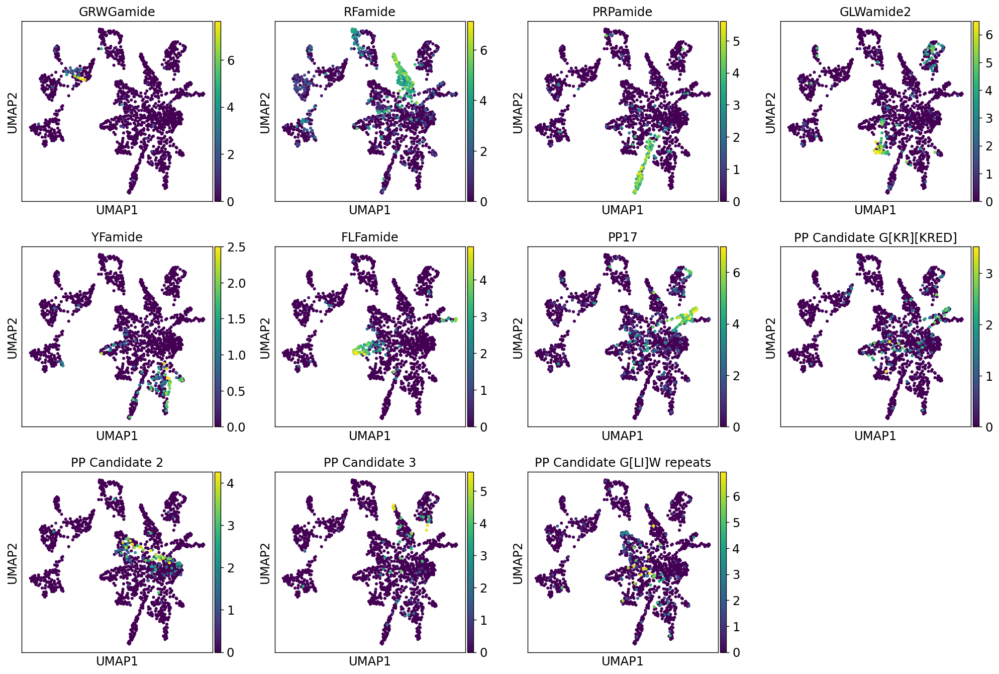

In [ ]:
sc.pl.umap(neurons, color=['XLOC_040584','XLOC_019434','XLOC_042761',
                           'XLOC_017097','XLOC_041402','XLOC_004021',
                           'XLOC_030120','XLOC_008730','XLOC_035224','XLOC_021799','XLOC_014624'],color_map='viridis',size=50,legend_loc='on data',
           title=['GRWGamide','RFamide','PRPamide',
                  'GLWamide2','YFamide','FLFamide',
                  'PP17','PP Candidate G[KR][KRED]','PP Candidate 2','PP Candidate 3','PP Candidate G[LI]W repeats'])